In [9]:
import cv2
import numpy as np
import math
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

In [10]:
import pytesseract

In [17]:
# function to plot image.
def plotting(image, cmap = None):
    if cmap == 'gray':
        height, width = image.shape
    else:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        height, width, depth = image.shape
    
    dpi = mpl.rcParams['figure.dpi']
    figsize = width/float(dpi), height/float(dpi)
    fig = plt.figure(figsize = figsize)
    
    plt.imshow(image, cmap)

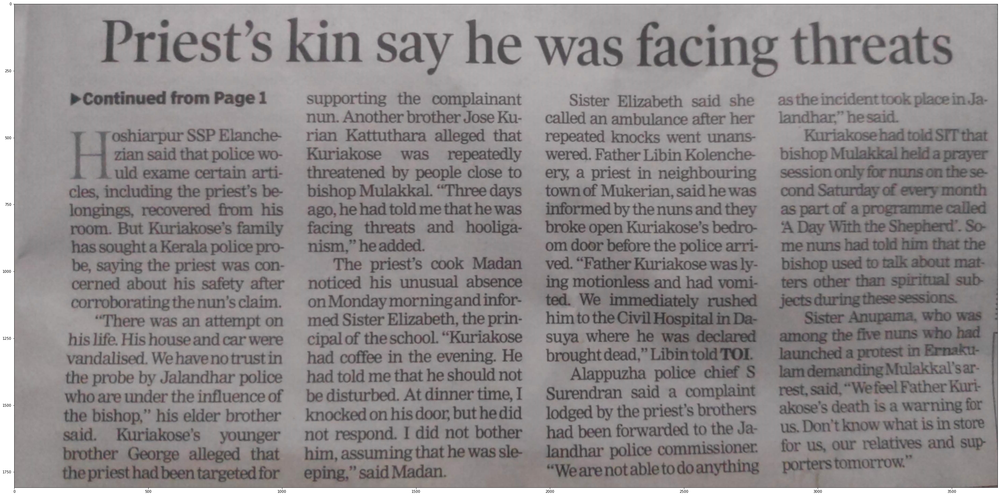

In [14]:
image = cv2.imread('Data/Images/IMG_20201031_182329_cropped.jpg')

plotting(image)

In [15]:
# Text without any preprocessing.
# Result is decent but the last part of the text is jumbled as the page was a bit folded. Need to fix it.

text = pytesseract.image_to_string(image)
print(text)

Priest’s kin say he was facing threats

> Continued from Page 1

oshiarpur SSP Elanche-

zian said that police wo-

uld exame certain arti-

cles, including the priest's be-
longings, recovered from his
room. But Kuriakose’s family

has sought a Kerala police pro-

be, saying the priest was con-

cerned about his safety after

corroborating the nun’s claim.

“There was an attempt on

his life. His house and car were
vandalised. We have no trust in
the probe by Jalandhar police
who are under the influence of
the bishop,” his elder brother

supporting the complainant
nun. Another brother Jose Ku-
rian Kattuthara alleged that
Kuriakose was_ repeatedly
threatened by people close to
bishop Mulakkal. “Three days
ago, he had told me that he was
ing threats and hooliga-
nism,” he added.

The priest’s cook Madan
noticed his unusual absence
on Monday morningand infor-
med Sister Elizabeth, the prin-
cipal of the school. “Kuriakose
had coffee in the evening. He
had told me that he should not
be d

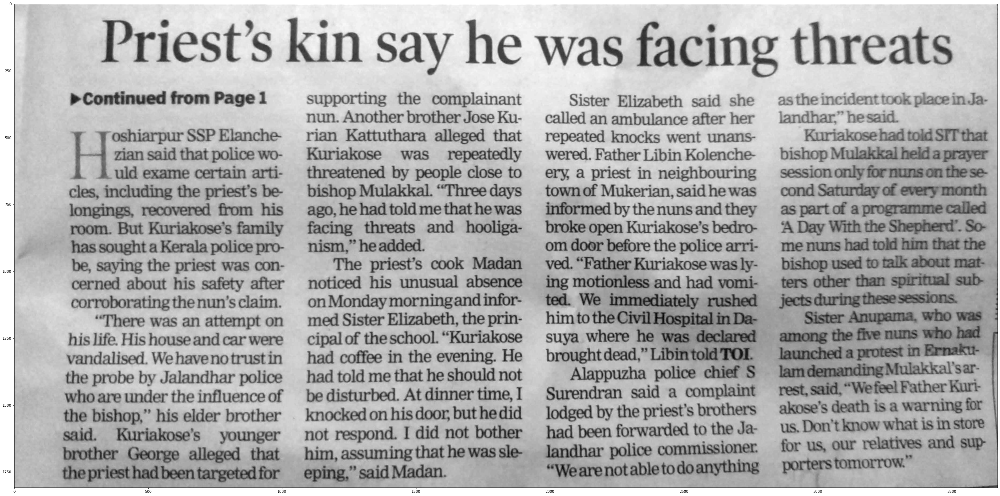

In [18]:
# converting image to greyscale.
# The image was already clear but the contrast between white and black is more now.
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plotting(gray, 'gray')

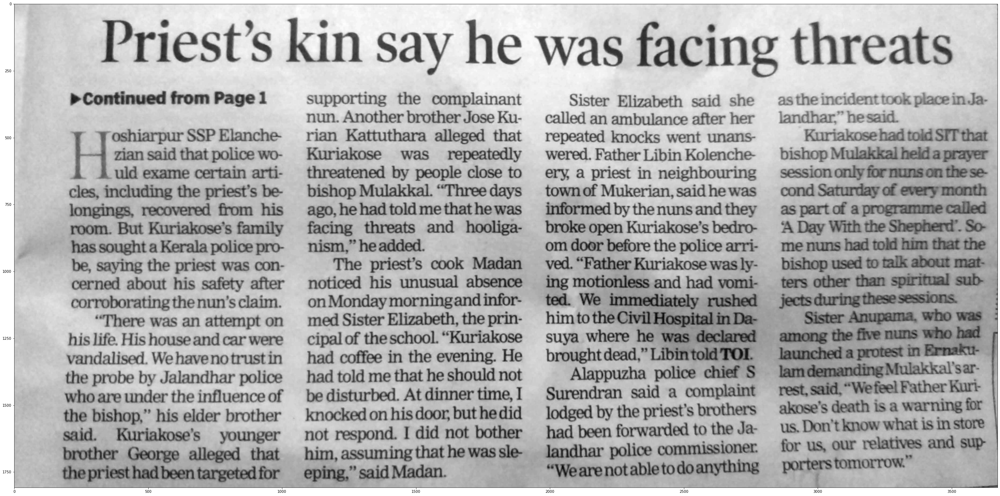

In [20]:
# Image smoothing/blurring (Median)
median = cv2.medianBlur(gray, 3)

plotting(median, 'gray')

In [21]:
# Text from far right bottom of the paper is not being converted string. 
text = pytesseract.image_to_string(median)
print(text)

Priest’s kin say he was facing threats

> Continued from Page 1

oshiarpur SSP Elanche-

zian said that police wo-

cles, including the priest’s be-

longings, recovered from his

room. But Kuriakose’s family

has sought a Kerala police pro-

be, saying the priest was con-

cerned about his safety after

corroborating the nun’s claim.

“There was an attempt on

his life. His house and car were
vandalised. We have no trust in
the probe by Jalandhar police
who are under the influence of
the bishop,” his elder brother
said. Kuriakose’s younger
brother George alleged that
the priest had been targeted for

supporting the complainant
nun. Another brother Jose Ku-
rian Kattuthara alleged that
Kuriakose was_ repeatedly
threatened by people close to
bishop Mulakkal. “Three days
ago, he had told me that he was
facing threats and hooliga-
nism,” he added.

The priest’s cook Madan
noticed his unusual absence
on Monday morningand infor-
med Sister Elizabeth, the prin-
cipal of the school. “Kuriakos

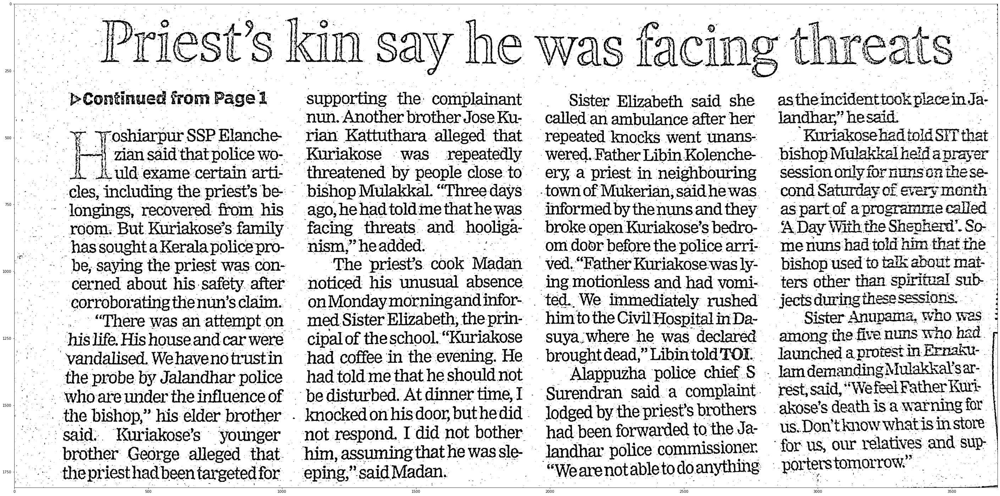

In [22]:
# Adaptive thresholding to make the image sharp again. we can observe major difference between the last image and this image.
adaptive_threshold_gaussian = cv2.adaptiveThreshold(median, 255, 
                                                    cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                                    cv2.THRESH_BINARY, 11, 2)
plotting(adaptive_threshold_gaussian, 'gray')

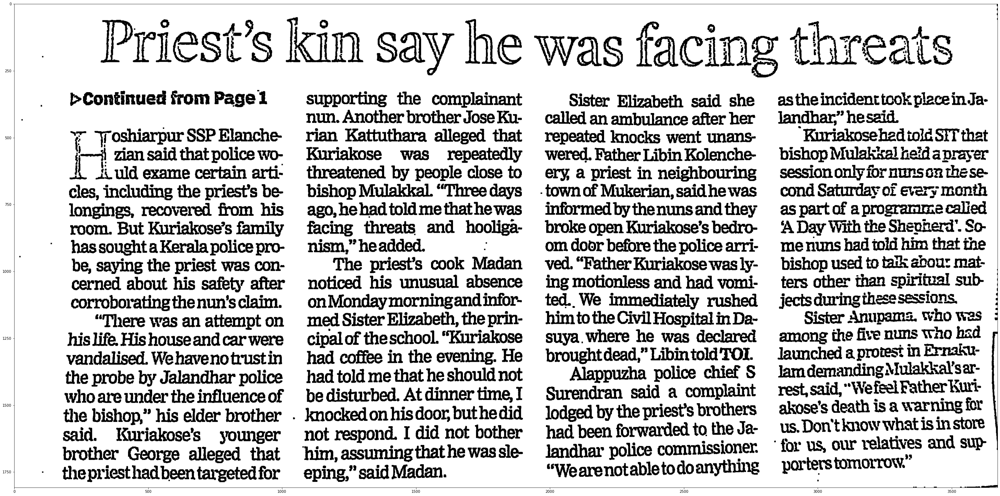

In [27]:
# Erosion and dilution to remove random noise.
imgThresh = cv2.dilate(adaptive_threshold_gaussian, cv2.getStructuringElement(cv2.MORPH_RECT, (3,3)))
imgThresh = cv2.erode(imgThresh, cv2.getStructuringElement(cv2.MORPH_RECT, (3,3)), iterations = 2)

plotting(imgThresh, 'gray')

In [29]:
text = pytesseract.image_to_string(imgThresh)
print(text)

Priest’s kin say he was facing threats

b>Continued from Page 1

‘¢ 7Voshiarpur SSP Elanche-
(ii zian said that police wo-
i ic uld exame certain arti-
cles, including the priest’s be-
longings, recovered from his
room. But Kuriakose’s family
has sought a Kerala police pro-
be, saying the priest was con-
cerned about his safety after
corroborating the nun’s claim.
“There was an attempt on

his life. His house and car were
vandalised. We havenotrustin
the probe by Jalandhar police
who are under the influence of
the bishop,” his elder brother
said. Kuriakose’s younger
brother George alleged that
the priest had been targeted for

supporting the complainant
nun. Another brother Jose Ku-
rian Kattuthara alleged that
Kuriakose was repeatedly
threatened by people close to
bishop Mulakkal “Three days
ago, he had told me that he was
facing threats and hooliga-
nism,” he added. :

The priest’s cook Madan
noticed his unusual absence
on Monday morningand infor-
med Sister Elizabeth, the prin-
cipa

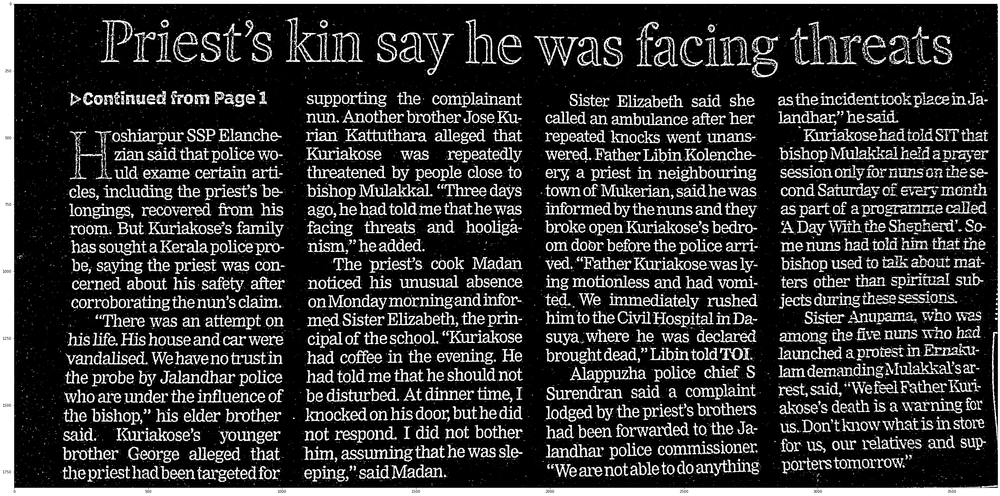

In [30]:
image_reverse = cv2.bitwise_not(adaptive_threshold_gaussian)
plotting(image_reverse, 'gray')